# Graph Layout Algorithms in NetworkX: Spring, Kamada-Kawai

This notebook provides an in-depth exploration of two layout algorithms using the Les Misérables dataset from NetworkX. We focus on the following methods:

1. **Spring Layout (Fruchterman-Reingold)** – a force-directed method modeling nodes as repelling particles connected by attractive springs.
2. **Kamada-Kawai Layout** – optimizes a global energy function based on the differences between ideal (graph-theoretic) and Euclidean distances.

Throughout the notebook, we will demonstrate how adjusting key parameters affects the visualization. The notebook assumes familiarity with Python and NetworkX, making it particularly suitable for master's students in complex systems.

In [16]:
import networkx as nx
from matplotlib import rcParams
import matplotlib.pyplot as plt


# Set matplotlib defaults for consistent visualization
rcParams['figure.dpi'] = 200

# Define visualization parameters for consistency across all plots
PARAMS = {
    # Node styling
    'node_color': 'white',
    'node_size': 40,
    'node_alpha': 0.9,
    'node_border_color': 'black',  # Add border color
    'node_border_width': 1,        # Add border width
    
    # Edge styling
    'edge_color': 'black',
    'edge_alpha': 0.6,
    'edge_width': 0.5,
    
    # Figure settings
    'figsize_single': (12, 10),
    'figsize_double': (18, 8)
}

In [17]:
# Load the Les Misérables graph from NetworkX examples
G = nx.generators.social.les_miserables_graph()

print(f"Les Misérables graph loaded: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

Les Misérables graph loaded: 77 nodes, 254 edges


## 1. Spring Layout (Fruchterman-Reingold Algorithm)

The spring layout is a force-directed graph drawing algorithm that simulates a physical system where nodes repel each other while edges act as springs pulling connected nodes together. This model was proposed by Fruchterman and Reingold in 1991.

### Key Parameters and Their Effects:

- **`k` (float)**: The optimal distance between nodes (natural spring length). Modifies the balance between repulsive and attractive forces:
  - Smaller values (e.g., 0.1) → Nodes cluster more tightly together
  - Larger values (e.g., 2.0) → Nodes spread more widely apart
  - Default: If `None`, uses `sqrt(n/k)` where n is the number of nodes

- **`iterations` (int)**: The number of iterations for force simulation:
  - Fewer iterations → Faster but potentially less optimized result
  - More iterations → Better layout convergence at the cost of computation time
  - Default: 50

- **`pos` (dict)**: Initial positions of nodes as a dictionary with node:position pairs
  - Useful for incremental layout adjustments
  - Default: Random initial positions

- **`fixed` (list)**: Nodes that should not be moved during layout
  - Can anchor certain nodes at specified positions

- **`scale` (float)**: Scale factor for the final positions
  - Controls the overall size of the layout
  - Default: 1.0

- **`center` (tuple)**: Center position for the layout
  - Default: (0.0, 0.0)

- **`dim` (int)**: Dimensionality of the layout (2D or 3D)
  - Default: 2

- **`seed` (int)**: Random seed for reproducibility of the layout
  - Essential for consistent results across runs

- **`weight` (string)**: Edge attribute name for weights in attractive force calculation
  - Affects how strongly connected nodes are pulled together
  - Default: None (all edges have equal weight)

The Spring Layout works by iteratively calculating forces on each node and adjusting positions accordingly. In each iteration:
1. Repulsive forces push all pairs of nodes away from each other
2. Attractive forces pull connected nodes toward each other
3. Positions are updated by a fraction of the calculated force (influenced by a "temperature" parameter that decreases over iterations)

### Spring Layout with Default Parameters

In [18]:
def draw_network(G, pos, node_colors=None, title=None, ax=None):
    """
    Draw a network with consistent styling.
    
    Parameters:
    -----------
    G : networkx.Graph
        The graph to visualize
    pos : dict
        Position dictionary for nodes
    node_colors : list or str, optional
        Colors for nodes. If None, uses default color from PARAMS
    title : str, optional
        Title for the plot
    ax : matplotlib.axes.Axes, optional
        Axes to draw on. If None, uses current axes
    """
    if node_colors is None:
        node_colors = PARAMS['node_color']
    
    nx.draw(G, pos=pos, 
            node_size=PARAMS['node_size'], 
            node_color=node_colors, 
            edge_color=PARAMS['edge_color'],
            alpha=PARAMS['node_alpha'],
            width=PARAMS['edge_width'],
            edgecolors=PARAMS['node_border_color'],
            linewidths=PARAMS['node_border_width'],
            ax=ax)
    
    if title and ax:
        ax.set_title(title, fontsize=16)
    elif title:
        plt.title(title, fontsize=16)
    
    if ax:
        ax.axis('equal')
    else:
        plt.axis('equal')

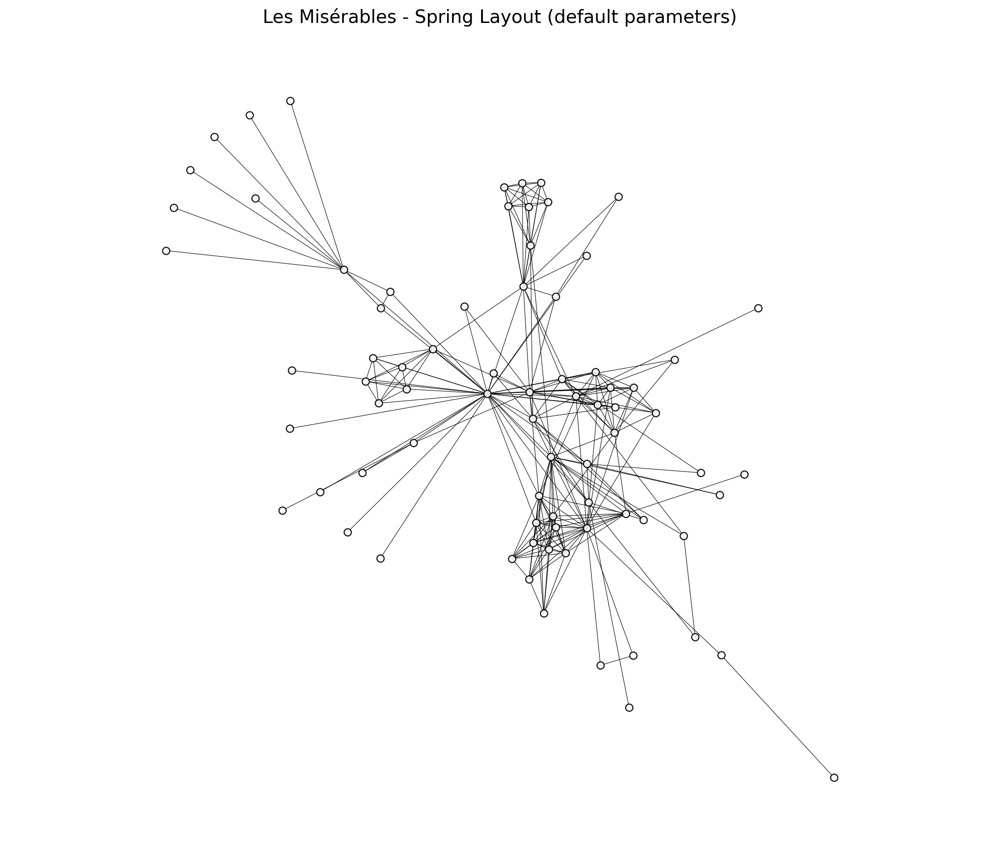

In [19]:
# Compute spring layout with default parameters
pos_default = nx.spring_layout(G, seed=42)

plt.figure(figsize=PARAMS['figsize_single'])
draw_network(G, pos=pos_default, title='Les Misérables - Spring Layout (default parameters)')
plt.show()

### Experimenting with the `k` Parameter

Changing the `k` parameter significantly affects the layout:

- A **smaller** `k` brings nodes closer together.
- A **larger** `k` pushes nodes further apart.

The plots below show various settings of `k`.

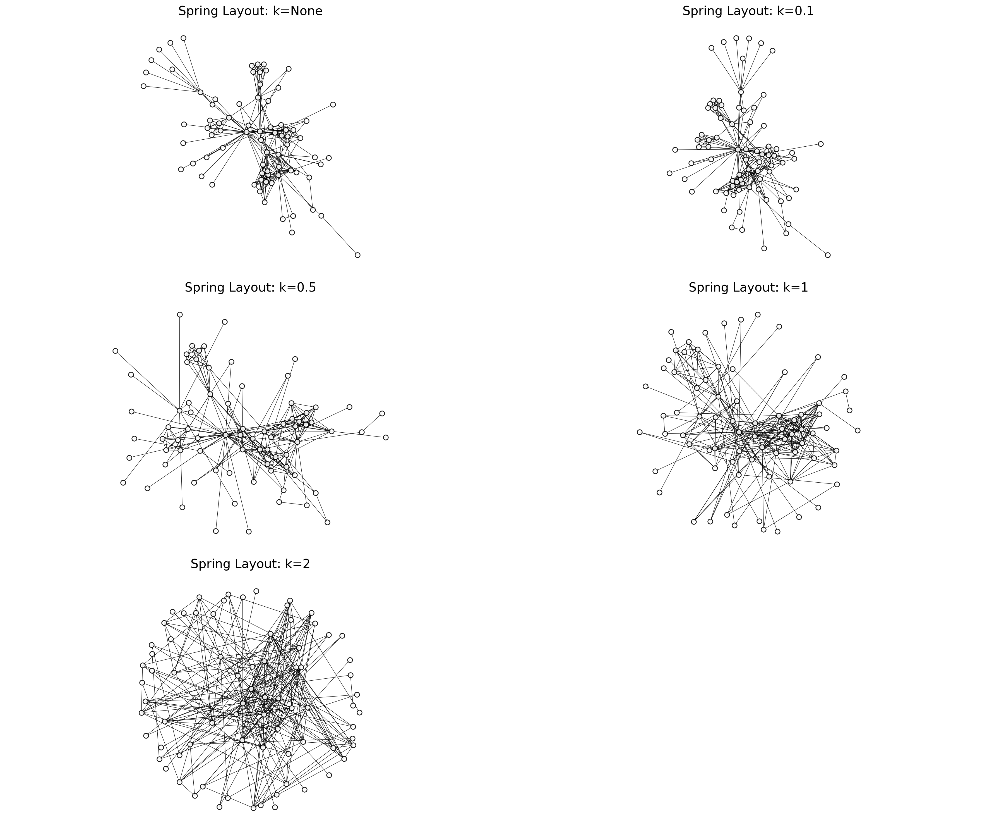

In [20]:
k_values = [None, 0.1, 0.5, 1, 2]

# Create a single figure with subplots for all k values
fig, axs = plt.subplots(3, 2, figsize=(18, 15))
axs = axs.flatten()  # Flatten the 2D array of axes to make indexing easier

for i, k in enumerate(k_values):
    if i < len(axs):  # Make sure we don't exceed the number of subplots
        pos = nx.spring_layout(G, k=k, seed=42)
        draw_network(G, pos=pos, title=f'Spring Layout: k={k}', ax=axs[i])

# Hide the last subplot if we have an odd number of plots
if len(k_values) % 2 == 1 and len(k_values) < len(axs):
    axs[-1].set_visible(False)

plt.tight_layout()
plt.show()

### Impact of Iterations

The number of iterations influences how well the simulation converges to an optimal layout. Fewer iterations might not give enough time for the forces to balance out, while more iterations provide a more refined placement. The following figures explore this effect.

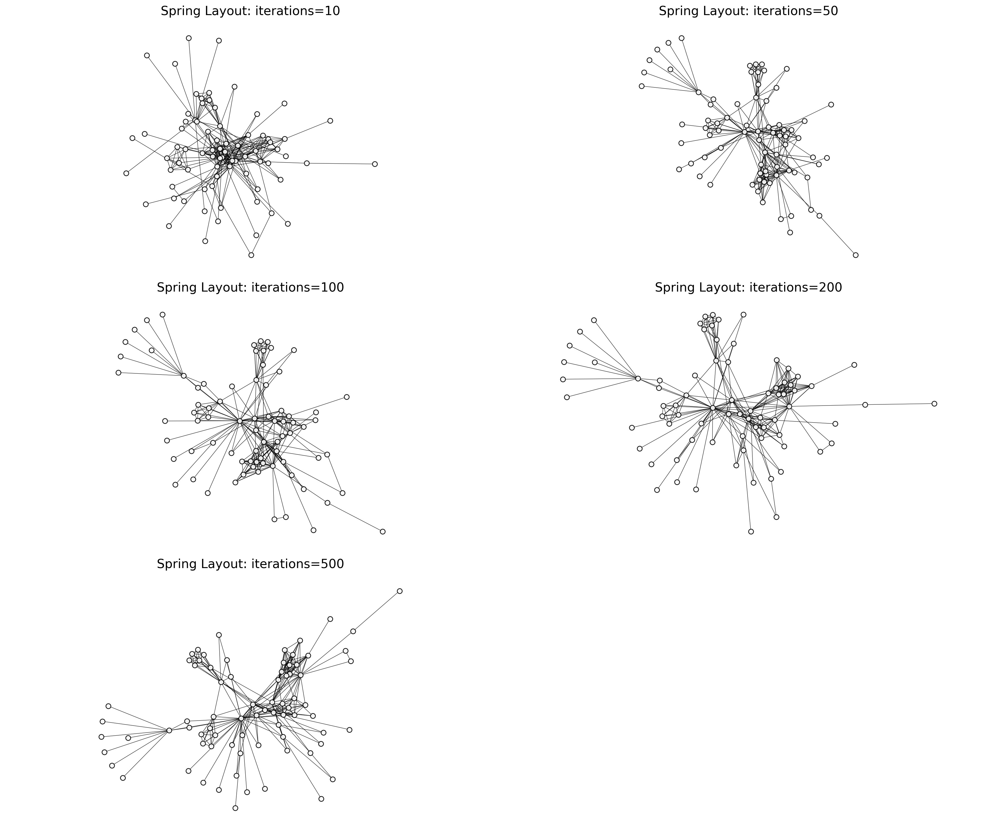

In [21]:
iter_values = [10, 50, 100, 200, 500]

# Create a single figure with subplots for all iteration values
fig, axs = plt.subplots(3, 2, figsize=(18, 15))
axs = axs.flatten()

for i, iters in enumerate(iter_values):
    if i < len(axs):
        pos = nx.spring_layout(G, iterations=iters, seed=42)
        draw_network(G, pos=pos, title=f'Spring Layout: iterations={iters}', ax=axs[i])

# Hide the last subplot if we have an odd number of plots
if len(iter_values) % 2 == 1 and len(iter_values) < len(axs):
    axs[-1].set_visible(False)

plt.tight_layout()
plt.show()

## 2. Kamada-Kawai Layout

The Kamada-Kawai layout algorithm, proposed by Tomihisa Kamada and Satoru Kawai in 1989, aims to create aesthetically pleasing layouts by minimizing a global energy function. Unlike the Spring Layout, which relies on local forces, Kamada-Kawai takes a more holistic approach by considering the graph's overall structure.

### Key Parameters and Their Effects:

- **`dist` (dictionary or None)**: The distance matrix containing shortest-path distances between all pairs of nodes
  - If None, the algorithm computes the shortest-path distances automatically
  - Can be customized to provide different distance measures
  - Default: None (uses shortest-path distances)

- **`pos` (dictionary or None)**: Initial positions of nodes
  - Useful as a starting point for refinement
  - Default: None (spectral initialization is used)

- **`weight` (string or None)**: Edge attribute to use as weight for shortest-path calculation
  - Affects the "ideal distances" in the layout
  - Default: None (all edges have equal weight)

- **`scale` (float)**: Scaling factor for the final positions
  - Controls the overall size of the layout
  - Default: 1.0

- **`center` (tuple)**: Center of the layout
  - Default: (0.0, 0.0)

- **`dim` (int)**: Dimensionality of the layout
  - Default: 2 (2D layout)

### How Kamada-Kawai Works:

1. **Ideal Distance Calculation**: The algorithm first computes the ideal distance for each pair of nodes, proportional to their shortest-path distance in the graph

2. **Energy Function**: Defines a global energy function that represents the sum of differences between ideal distances and Euclidean distances in the layout:
   E = Σ(i,j) k_ij × (|X_i - X_j| - d_ij)²
   where:
   - k_ij is the "spring stiffness" inversely proportional to d_ij²
   - d_ij is the ideal distance between nodes i and j
   - X_i, X_j are the positions of nodes i and j

3. **Optimization**: The algorithm minimizes this energy function by iteratively moving the node with the greatest gradient until the system reaches equilibrium

4. **Convergence**: The process continues until the maximum gradient falls below a threshold, indicating that the layout has stabilized

The Kamada-Kawai layout is particularly effective for visualizing graph-theoretic properties like path distances, as it attempts to make the Euclidean distances in the layout proportional to the shortest-path distances in the graph.

### Default Kamada-Kawai Layout

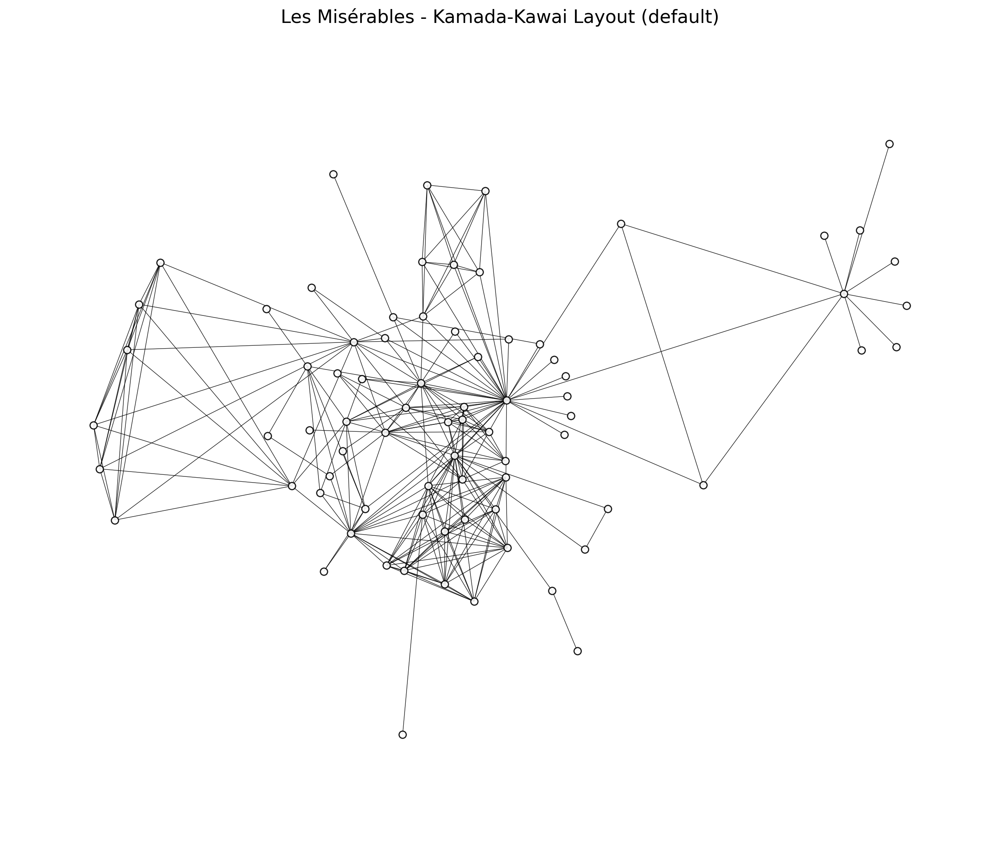

In [22]:
# Compute Kamada-Kawai layout with default parameters
pos_kk = nx.kamada_kawai_layout(G)

plt.figure(figsize=PARAMS['figsize_single'])
draw_network(G, pos=pos_kk, title='Les Misérables - Kamada-Kawai Layout (default)')
plt.show()

### Exploring Kamada-Kawai Parameters

Let's analyze how different parameters affect the Kamada-Kawai layout. We'll focus on exploring the effects of:

1. **Scale parameter**: Controls the overall size of the visualization
2. **Weight parameter**: Affects how edge weights influence distance calculations
3. **Initial positions**: How different starting configurations affect the final layout

#### The Effect of Scale Parameter

The `scale` parameter determines the overall size of the layout. Larger values spread nodes further apart, while smaller values compress the layout.

Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y

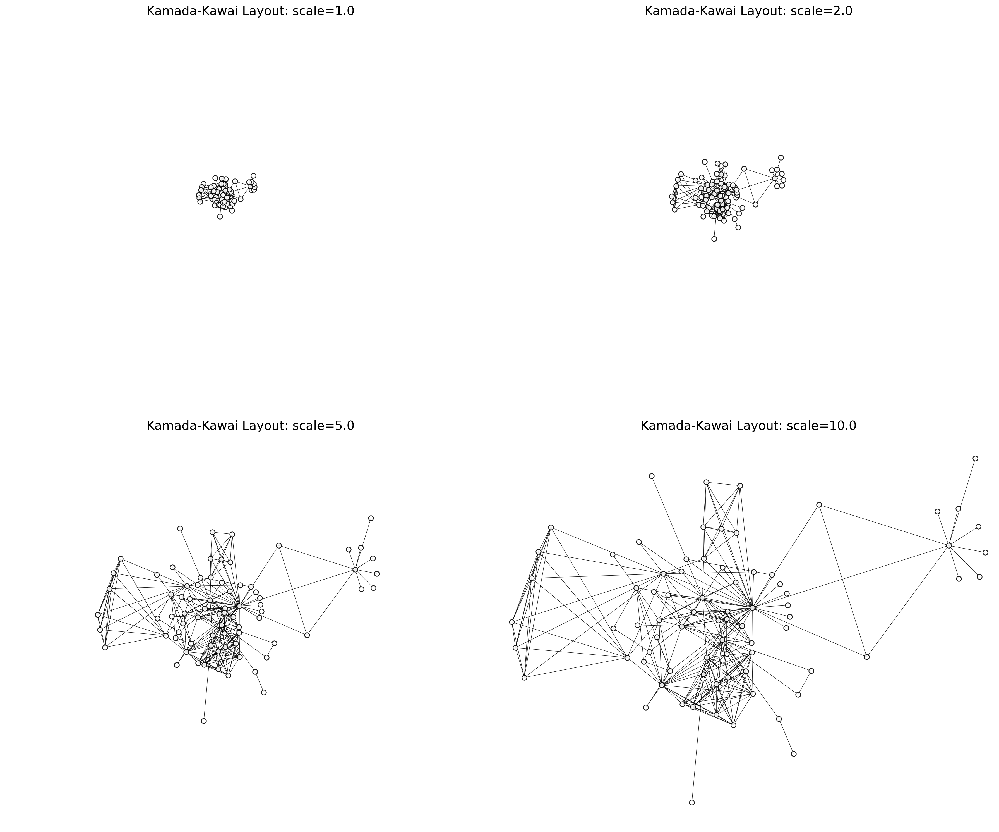

In [23]:
scale_values = [1.0, 2.0, 5.0, 10.0]

import numpy as np

# Compute positions for each scale
positions = [nx.kamada_kawai_layout(G, scale=scale) for scale in scale_values]

# Determine global x and y limits across all layouts
all_x = [pos[node][0] for pos in positions for node in pos]
all_y = [pos[node][1] for pos in positions for node in pos]
xmin, xmax = np.min(all_x), np.max(all_x)
ymin, ymax = np.min(all_y), np.max(all_y)

fig, axs = plt.subplots(2, 2, figsize=(18, 15))
axs = axs.flatten()

for i, (scale, pos) in enumerate(zip(scale_values, positions)):
    if i < len(axs):
        draw_network(G, pos=pos, title=f'Kamada-Kawai Layout: scale={scale}', ax=axs[i])
        # Set the same limits for all subplots
        axs[i].set_xlim(xmin, xmax)
        axs[i].set_ylim(ymin, ymax)

plt.tight_layout()
plt.show()

#### The Effect of Custom Distance Matrix

The `dist` parameter allows for customized distance matrices. By default, Kamada-Kawai uses shortest-path distances, but we can modify these to achieve different layouts. Below, we compare the default distance calculation with a custom one where we artificially increase distances between high-degree nodes and others.

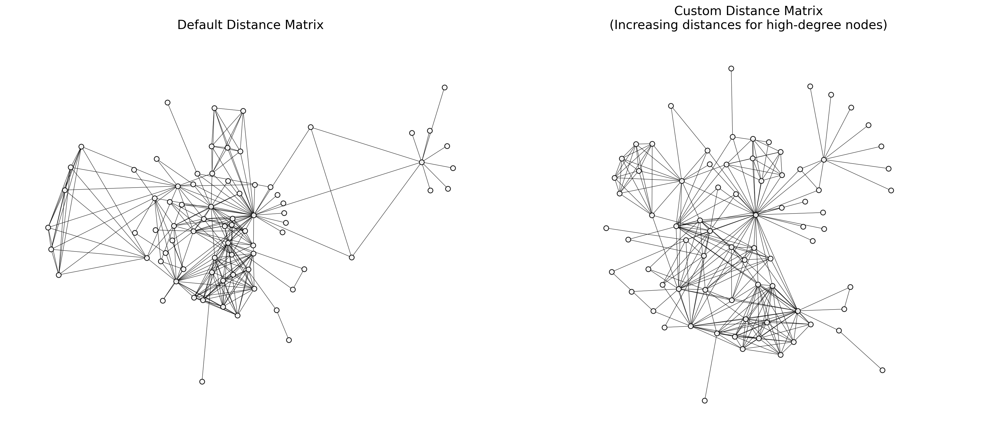

In [24]:
# Calculate default shortest path distances
path_lengths = dict(nx.all_pairs_shortest_path_length(G))

# Create a custom distance matrix by modifying some distances
custom_dist = {}
for u in G.nodes():
    custom_dist[u] = {}
    for v in G.nodes():
        if u == v:
            custom_dist[u][v] = 0
        elif v in path_lengths[u]:
            # Make distances between high-degree nodes and others larger
            if G.degree(u) > 15 or G.degree(v) > 15:
                custom_dist[u][v] = path_lengths[u][v] * 1.5
            else:
                custom_dist[u][v] = path_lengths[u][v]
        else:
            custom_dist[u][v] = len(G)  # Disconnected nodes

# Compare default and custom distance calculations
fig, axs = plt.subplots(1, 2, figsize=PARAMS['figsize_double'])

# Default distances
pos_default = nx.kamada_kawai_layout(G)
draw_network(G, pos=pos_default, title='Default Distance Matrix', ax=axs[0])

# Custom distances
pos_custom = nx.kamada_kawai_layout(G, dist=custom_dist)
draw_network(G, pos=pos_custom, title='Custom Distance Matrix\n(Increasing distances for high-degree nodes)', ax=axs[1])

plt.tight_layout()
plt.show()

#### Impact of Initial Positions

The `pos` parameter allows us to provide initial positions for the layout. Starting with different initial configurations can lead to different final layouts due to the optimization process potentially finding different local minima.

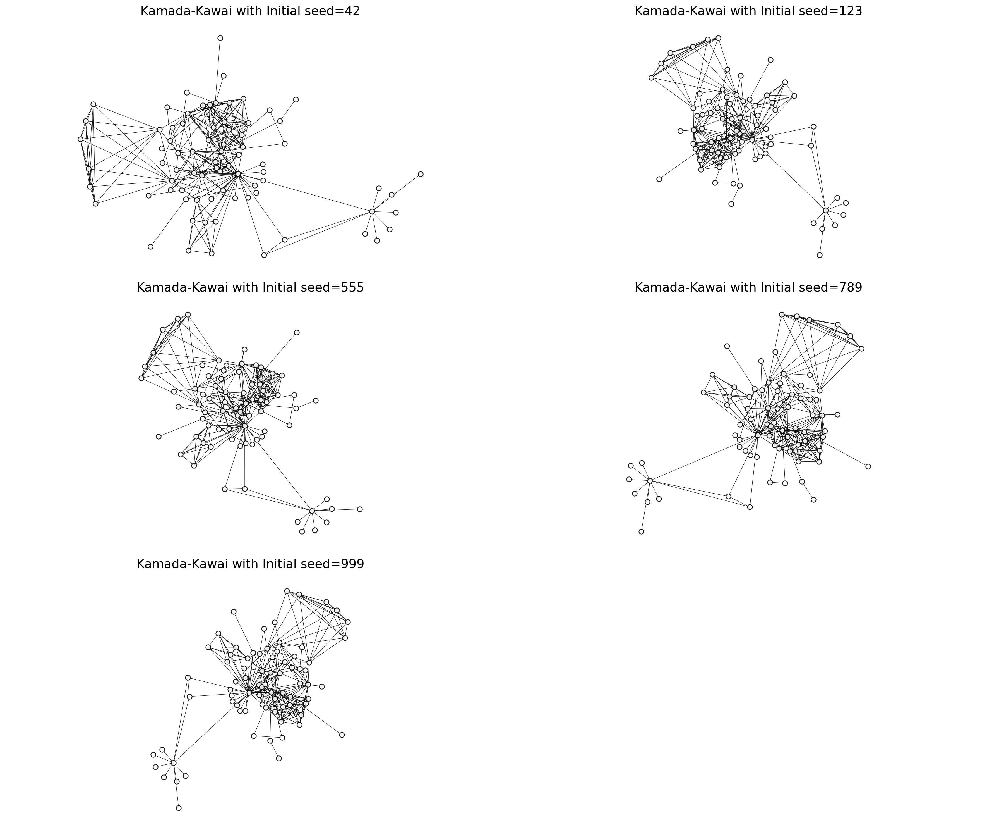

In [25]:
seed_values = [42, 123, 555, 789, 999]

# Create a single figure with subplots for all seed values
fig, axs = plt.subplots(3, 2, figsize=(18, 15))
axs = axs.flatten()

for i, seed in enumerate(seed_values):
    if i < len(axs):
        # Create random initial positions
        initial_pos = nx.random_layout(G, seed=seed)
        
        # Use these initial positions for Kamada-Kawai
        pos = nx.kamada_kawai_layout(G, pos=initial_pos)
        
        draw_network(G, pos=pos, title=f'Kamada-Kawai with Initial seed={seed}', ax=axs[i])

# Hide the last subplot if we have an odd number of plots
if len(seed_values) % 2 == 1 and len(seed_values) < len(axs):
    axs[-1].set_visible(False)

plt.tight_layout()
plt.show()

#### Comparison: Spring Layout vs. Kamada-Kawai Layout

Let's directly compare the Spring Layout and Kamada-Kawai Layout side by side to better understand their differences. Both algorithms aim to create aesthetically pleasing layouts, but they approach the problem differently:

- Spring Layout uses local forces and iterative simulation
- Kamada-Kawai uses global energy minimization

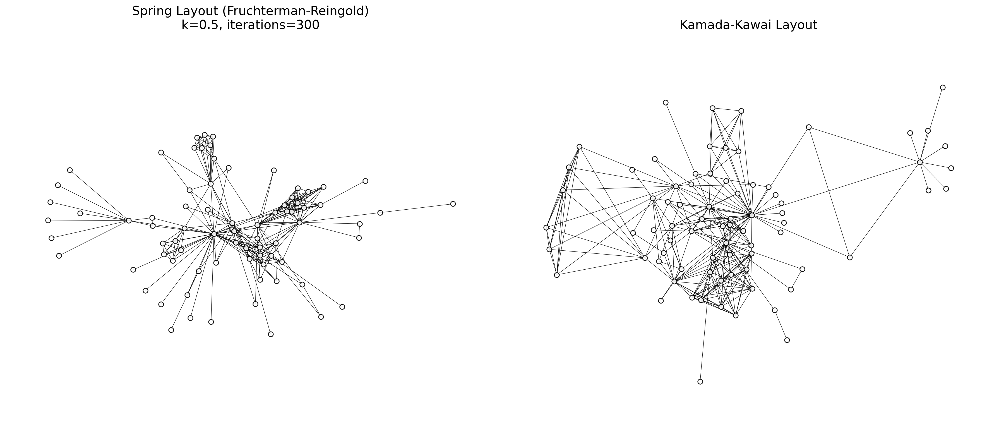

In [26]:
# Create a side-by-side comparison with optimized parameters for each
fig, axs = plt.subplots(1, 2, figsize=PARAMS['figsize_double'])

# Spring Layout (optimized parameters)
pos_spring = nx.spring_layout(G, k=0.5, iterations=300, seed=42)
draw_network(G, pos=pos_spring, title='Spring Layout (Fruchterman-Reingold)\nk=0.5, iterations=300', ax=axs[0])

# Kamada-Kawai Layout
pos_kk = nx.kamada_kawai_layout(G)
draw_network(G, pos=pos_kk, title='Kamada-Kawai Layout', ax=axs[1])

plt.tight_layout()
plt.show()

### Identifying Communities in Network Layouts

Both layout algorithms can effectively reveal the community structure in the network. Let's highlight the communities in Les Misérables network by coloring nodes according to their community assignment using the Louvain method for community detection.

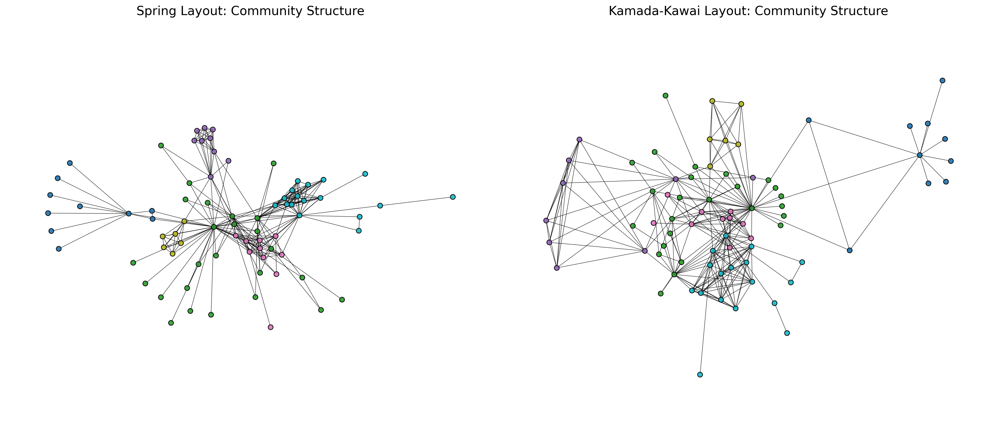

In [27]:
# Detect communities using the Louvain method
from community import best_partition

# Find communities
partition = best_partition(G)

# Create a list of community memberships
communities = [partition[node] for node in G.nodes()]

# Get a color map with enough distinct colors
cmap = plt.get_cmap('tab10', max(communities) + 1)
node_colors = [cmap(comm) for comm in communities]

# Plot both layouts with community coloring
fig, axs = plt.subplots(1, 2, figsize=PARAMS['figsize_double'])

# Spring Layout with communities
pos_spring = nx.spring_layout(G, k=0.5, iterations=300, seed=42)
draw_network(G, pos=pos_spring, node_colors=node_colors, title='Spring Layout: Community Structure', ax=axs[0])

# Kamada-Kawai Layout with communities
pos_kk = nx.kamada_kawai_layout(G)
draw_network(G, pos=pos_kk, node_colors=node_colors, title='Kamada-Kawai Layout: Community Structure', ax=axs[1], )

plt.tight_layout()
plt.show()

## Conclusion

In this notebook we have compared two approaches to laying out a network:

- The **Spring Layout** (Fruchterman-Reingold) models physical forces between nodes and allows intuitive parameter tuning (`k`, `iterations`, etc.)
- The **Kamada-Kawai Layout** optimizes a global stress function based on differences between ideal and actual node distances

Choosing the right layout depends on the specific features you wish to emphasize. Experimentation, as demonstrated here, is key to obtaining clear and insightful visualizations for complex networks.

Key observations:
1. The Spring Layout is more sensitive to parameter choices and can produce a wide variety of visualizations
2. The Kamada-Kawai Layout often produces more balanced and aesthetically pleasing layouts with fewer parameter adjustments
3. Both algorithms can effectively reveal community structure, especially when combined with community detection algorithms
4. Initial conditions and parameter settings can significantly impact the final visualization

For complex network analysis, it's often valuable to try multiple layout algorithms and parameter settings to find the most informative visualization for your specific data and research questions.

## Working with Weighted Networks

So far, we've been working with an unweighted version of the Les Misérables network. Now, let's explore how layout algorithms behave with weighted networks, where edge weights can significantly affect the layout.

In NetworkX, both the Spring Layout and Kamada-Kawai Layout support weighted edges through the `weight` parameter, which specifies which edge attribute to use as the weight.

### Creating a Weighted Version of Les Misérables

For this example, we'll modify our Les Misérables graph by adding weights to the edges based on the intensity of character interactions. Normally these would come from your data, but for demonstration purposes, we'll create synthetic weights:

In [28]:
# Create a weighted version of the Les Misérables graph
G_weighted = G.copy()

# Assign weights to edges (for demonstration purposes)
# In a real scenario, these weights would come from your data
import random
random.seed(42)  # For reproducibility

# Assign random weights between 1 and 100 to represent interaction strength
for u, v in G_weighted.edges():
    G_weighted[u][v]['weight'] = random.randint(1, 100)

# Display some statistics about the weights
weights = [G_weighted[u][v]['weight'] for u, v in G_weighted.edges()]
print(f"Edge weight statistics:")
print(f"  Minimum weight: {min(weights)}")
print(f"  Maximum weight: {max(weights)}")
print(f"  Average weight: {sum(weights)/len(weights):.2f}")
print(f"  Number of edges: {len(weights)}")

# View a sample of the weighted edges
print("\nSample of weighted edges:")
for i, (u, v, w) in enumerate(G_weighted.edges(data='weight')):
    if i < 5:  # Just show the first 5 edges
        print(f"  {u} -- {v}: weight = {w}")
print("  ...")

Edge weight statistics:
  Minimum weight: 1
  Maximum weight: 100
  Average weight: 51.31
  Number of edges: 254

Sample of weighted edges:
  Napoleon -- Myriel: weight = 82
  Myriel -- MlleBaptistine: weight = 15
  Myriel -- MmeMagloire: weight = 4
  Myriel -- CountessDeLo: weight = 95
  Myriel -- Geborand: weight = 36
  ...


### Using Weights in Layout Algorithms

Both Spring Layout and Kamada-Kawai Layout can incorporate edge weights. In the Spring Layout, weights affect the strength of the attractive forces between nodes, with higher weights resulting in stronger attraction. In the Kamada-Kawai Layout, weights affect the ideal distances between nodes, with higher weights resulting in shorter ideal distances.

Let's compare weighted and unweighted layouts:

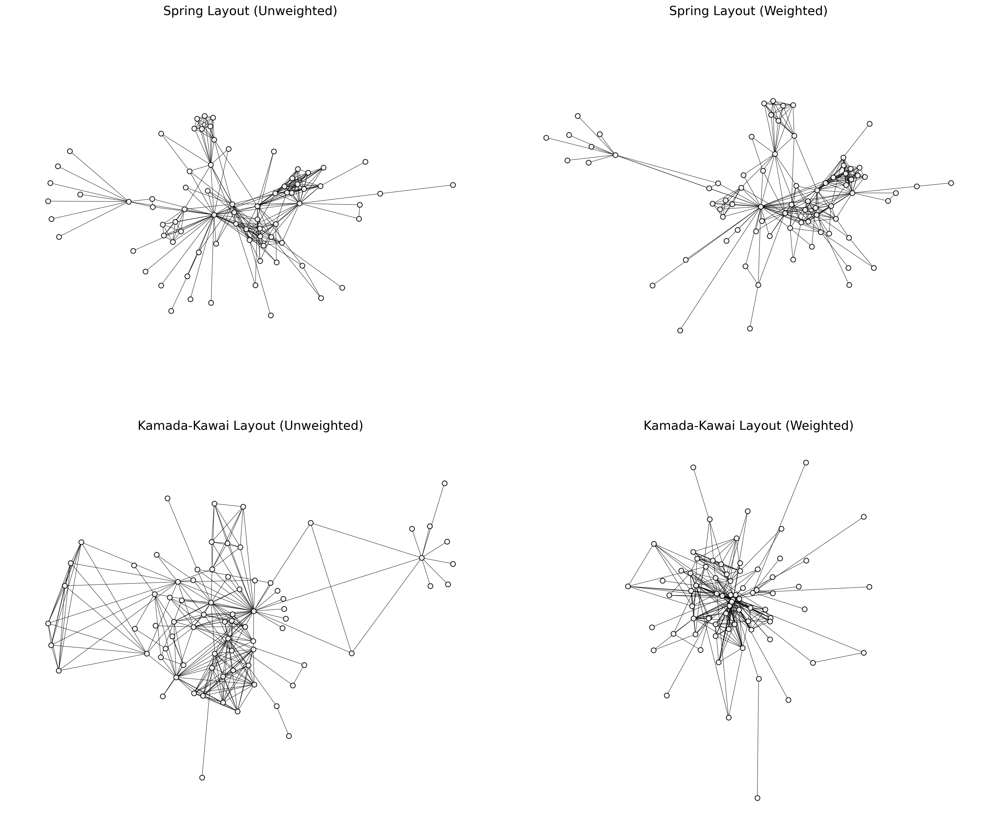

In [29]:
# Compare weighted and unweighted layouts
fig, axs = plt.subplots(2, 2, figsize=(18, 15))
axs = axs.flatten()

# 1. Spring Layout - Unweighted
pos_spring_unweighted = nx.spring_layout(G, k=0.5, iterations=300, seed=42)
draw_network(G, pos=pos_spring_unweighted, 
             title='Spring Layout (Unweighted)', ax=axs[0])

# 2. Spring Layout - Weighted
pos_spring_weighted = nx.spring_layout(G_weighted, k=0.5, iterations=300, 
                                      seed=42, weight='weight')
draw_network(G_weighted, pos=pos_spring_weighted, 
             title='Spring Layout (Weighted)', ax=axs[1])

# 3. Kamada-Kawai Layout - Unweighted
pos_kk_unweighted = nx.kamada_kawai_layout(G)
draw_network(G, pos=pos_kk_unweighted, 
             title='Kamada-Kawai Layout (Unweighted)', ax=axs[2])

# 4. Kamada-Kawai Layout - Weighted
pos_kk_weighted = nx.kamada_kawai_layout(G_weighted, weight='weight')
draw_network(G_weighted, pos=pos_kk_weighted, 
             title='Kamada-Kawai Layout (Weighted)', ax=axs[3])

plt.tight_layout()
plt.show()

### Visualizing Edge Weights

We can enhance our visualization by representing edge weights visually. There are several ways to do this:

1. **Edge width**: Thicker edges represent stronger connections
2. **Edge color**: Different colors represent different weight ranges
3. **Edge opacity**: More opaque edges represent stronger connections

Let's demonstrate the edge width approach:

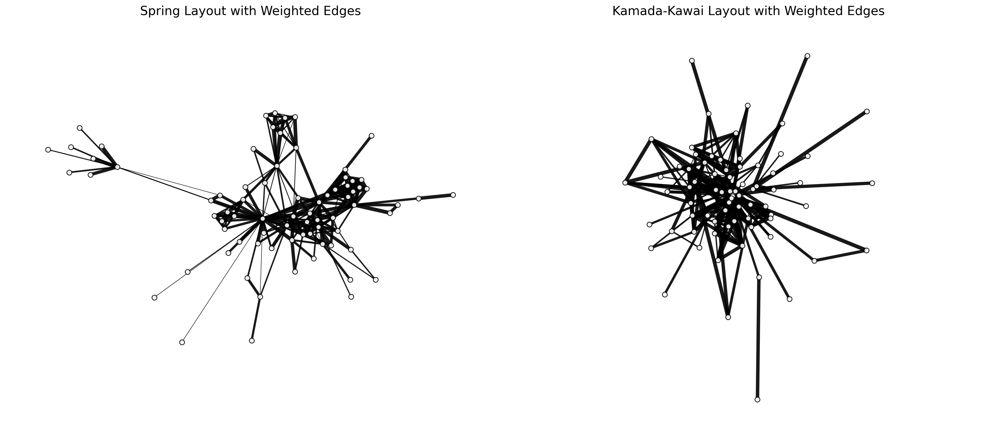

In [30]:
def draw_weighted_network(G, pos, ax=None, title=None):
    """
    Draw a weighted network with edge widths proportional to weights.
    
    Parameters:
    -----------
    G : networkx.Graph
        The weighted graph to visualize
    pos : dict
        Position dictionary for nodes
    ax : matplotlib.axes.Axes, optional
        Axes to draw on
    title : str, optional
        Title for the plot
    """
    # Get edge weights
    weights = [G[u][v]['weight'] for u, v in G.edges()]
    
    # Normalize weights for visualization (scale between 0.5 and 5)
    min_w, max_w = min(weights), max(weights)
    edge_widths = [0.5 + 4.5 * (w - min_w) / (max_w - min_w) for w in weights]
    
    # Draw the network
    nx.draw(G, pos=pos, 
            node_size=PARAMS['node_size'], 
            node_color=PARAMS['node_color'], 
            edge_color=PARAMS['edge_color'],
            alpha=PARAMS['node_alpha'],
            width=edge_widths,  # Use calculated edge widths
            edgecolors=PARAMS['node_border_color'],
            linewidths=PARAMS['node_border_width'],
            ax=ax)
    
    if title and ax:
        ax.set_title(title, fontsize=16)
    elif title:
        plt.title(title, fontsize=16)
    
    if ax:
        ax.axis('equal')
    else:
        plt.axis('equal')

# Create a visualization with weighted edges
fig, axs = plt.subplots(1, 2, figsize=PARAMS['figsize_double'])

# Spring Layout with weighted edges
pos = nx.spring_layout(G_weighted, k=0.5, iterations=300, seed=42, weight='weight')
draw_weighted_network(G_weighted, pos=pos, 
                     title='Spring Layout with Weighted Edges', ax=axs[0])

# Kamada-Kawai Layout with weighted edges
pos = nx.kamada_kawai_layout(G_weighted, weight='weight')
draw_weighted_network(G_weighted, pos=pos, 
                     title='Kamada-Kawai Layout with Weighted Edges', ax=axs[1])

plt.tight_layout()
plt.show()

### Effect of Edge Weights on Layout

Edge weights have a significant impact on how the layout algorithms position nodes:

1. In the **Spring Layout** (Fruchterman-Reingold):
   - Higher weight edges act as stronger springs, pulling connected nodes closer together
   - The layout tends to group nodes connected by high-weight edges
   - Nodes connected by low-weight edges will be positioned farther apart

2. In the **Kamada-Kawai Layout**:
   - Edge weights are used to compute the "ideal distances" between nodes
   - Higher weights result in shorter ideal distances
   - The global stress function tries to make the Euclidean distances proportional to these ideal distances

When working with weighted networks, it's important to consider:
- The weight distribution (are there extreme outliers?)
- Whether weights represent similarity (higher weight = stronger connection) or distance (higher weight = weaker connection)
- Whether pre-processing (like normalization) is needed

Weighted layouts are particularly useful for networks where edge weights have clear physical or social meanings, such as:
- Transportation networks (where weights might represent travel times or distances)
- Social networks (where weights might represent interaction frequencies)
- Collaboration networks (where weights might represent number of joint works)